In [191]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [192]:
dataset_path = 'dataset.csv'
data = pd.read_csv(dataset_path)
data

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,113995,2C3TZjDRiAzdyViavDJ217,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,False,0.172,0.2350,...,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,world-music
113996,113996,1hIz5L4IB9hN3WRYPOCGPw,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,False,0.174,0.1170,...,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,world-music
113997,113997,6x8ZfSoqDjuNa5SVP5QjvX,Cesária Evora,Best Of,Miss Perfumado,22,271466,False,0.629,0.3290,...,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,world-music
113998,113998,2e6sXL2bYv4bSz6VTdnfLs,Michael W. Smith,Change Your World,Friends,41,283893,False,0.587,0.5060,...,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4,world-music


<h1>Understanding The Data</h1>
<ul>
<li>popularity: (0-100) based on most recent, most played tracks</li>
<li>explicit: (T/F) contains explicit lyrics</li>
<li>danceability: (0.0-1.0) based on tempo, rhythm stability, beat strength</li>
<li>energy: (0.0-1.0) based on fast,loud,and noise</li>
<li>key: 0=C, 1=C#/Db, 2=D</li>
<li>mode: major = 1, minor = 0</li>
<li>speechiness: (0.0-1.0), < 0.33 non-speech like</li>
<li>acousticness: (0.0-1.0)</li>
<li>instructmentalness: (0.0-1.0) 1.0= instrucmental, "Ooh" and "ahh" are treated as instrumental</li>
<li>liveness: Listen for audience, >0.8 is likely live</li>
<li>valence: (0.0-1.0) high=happy, cheerful, euphoric. low = sad, depressed, angry</li>
<li>tempo: BPM</li>
</ul>

<h1>Cleaning of Data</h1>

In [193]:
data.isnull().sum()

Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [194]:
data[data["artists"].isnull()]
data.drop([65900], inplace=True)
data.isnull().sum()

Unnamed: 0          0
track_id            0
artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [195]:
data

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,113995,2C3TZjDRiAzdyViavDJ217,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,False,0.172,0.2350,...,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,world-music
113996,113996,1hIz5L4IB9hN3WRYPOCGPw,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,False,0.174,0.1170,...,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,world-music
113997,113997,6x8ZfSoqDjuNa5SVP5QjvX,Cesária Evora,Best Of,Miss Perfumado,22,271466,False,0.629,0.3290,...,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,world-music
113998,113998,2e6sXL2bYv4bSz6VTdnfLs,Michael W. Smith,Change Your World,Friends,41,283893,False,0.587,0.5060,...,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4,world-music


In [196]:
#Drop TrackID & Unamed 0
data.drop(['Unnamed: 0', 'track_id','album_name'], axis=1, inplace=True)
data.head()

,artists,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,Gen Hoshino,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,Ben Woodward,Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,Ingrid Michaelson;ZAYN,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,Kina Grannis,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,Chord Overstreet,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [197]:
#Check for duplicate track_name
data[data.duplicated(['track_name'])]

,artists,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
18,Jason Mraz;Colbie Caillat,Lucky,68,189613,False,0.625,0.414,0,-8.700,1,0.0369,0.294000,0.000000,0.1510,0.6690,130.088,4,acoustic
20,Jason Mraz,I'm Yours,75,242946,False,0.703,0.444,11,-9.331,1,0.0417,0.559000,0.000000,0.0973,0.7120,150.960,4,acoustic
22,A Great Big World;Christina Aguilera,Say Something,70,229400,False,0.407,0.147,2,-8.822,1,0.0355,0.857000,0.000003,0.0913,0.0765,141.284,3,acoustic
28,Jason Mraz,Winter Wonderland,0,131760,False,0.620,0.309,5,-9.209,1,0.0495,0.788000,0.000000,0.1460,0.6640,145.363,4,acoustic
29,Jason Mraz,Winter Wonderland,0,131760,False,0.620,0.309,5,-9.209,1,0.0495,0.788000,0.000000,0.1460,0.6640,145.363,4,acoustic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113974,Chris Tomlin,Faithful,34,285120,False,0.618,0.419,6,-6.156,1,0.0279,0.309000,0.000000,0.1070,0.3730,131.973,4,world-music
113980,I AM THEY,Amen,41,238146,False,0.516,0.634,7,-4.850,1,0.0339,0.030000,0.000002,0.0813,0.0921,76.994,4,world-music
113987,Planetshakers,All My Life - Live,40,246306,False,0.470,0.938,11,-4.722,0,0.1050,0.000529,0.000000,0.2510,0.4530,128.002,4,world-music
113991,Chris Tomlin,At The Cross (Love Ran Red),32,250629,False,0.387,0.531,8,-4.788,1,0.0290,0.003050,0.000000,0.2010,0.1530,146.003,4,world-music


In [198]:
# Find track_name I'm Yours	
data[data['track_name'] == 'I\'m Yours']
data.drop_duplicates(subset='track_name', keep='first', inplace=True)
data[data['track_name'] == 'I\'m Yours']

,artists,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
7,Jason Mraz,I'm Yours,80,242946,False,0.703,0.444,11,-9.331,1,0.0417,0.559,0.0,0.0973,0.712,150.96,4,acoustic


In [199]:
data

,artists,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,Gen Hoshino,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,Ben Woodward,Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,Ingrid Michaelson;ZAYN,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,Kina Grannis,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,Chord Overstreet,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113994,Lucas Cervetti,"Frecuencia Álmica, Pt. 4",22,305454,False,0.331,0.1710,1,-15.668,1,0.0350,0.9200,0.022900,0.0679,0.3270,132.147,3,world-music
113995,Rainy Lullaby,Sleep My Little Boy,21,384999,False,0.172,0.2350,5,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,world-music
113996,Rainy Lullaby,Water Into Light,22,385000,False,0.174,0.1170,0,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,world-music
113997,Cesária Evora,Miss Perfumado,22,271466,False,0.629,0.3290,0,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,world-music


In [200]:
#Unique Track Genre
data['track_genre'].unique()

array(['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago-house', 'children',
       'chill', 'classical', 'club', 'comedy', 'country', 'dance',
       'dancehall', 'death-metal', 'deep-house', 'detroit-techno',
       'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
       'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
       'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove',
       'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle',
       'heavy-metal', 'hip-hop', 'honky-tonk', 'house', 'idm', 'indian',
       'indie-pop', 'indie', 'industrial', 'iranian', 'j-dance', 'j-idol',
       'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids', 'latin', 'latino',
       'malay', 'mandopop', 'metal', 'metalcore', 'minimal-techno', 'mpb',
       'new-age', 'opera', 'pagode', 'party', 'piano', 'pop-film', 'pop',
       'pow

In [201]:
# Change Explicit to 0 and 1
data['explicit'] = data['explicit'].map({False: 0, True: 1})
data.head()

,artists,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,Gen Hoshino,Comedy,73,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,Ben Woodward,Ghost - Acoustic,55,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,Ingrid Michaelson;ZAYN,To Begin Again,57,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,Kina Grannis,Can't Help Falling In Love,71,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,Chord Overstreet,Hold On,82,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [202]:
# Change Duration_ms into minutes
data['duration_min'] = data['duration_ms'] / 60000
data.drop(['duration_ms'], axis=1, inplace=True)
data.head()

,artists,track_name,popularity,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,duration_min
0,Gen Hoshino,Comedy,73,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic,3.844433
1,Ben Woodward,Ghost - Acoustic,55,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic,2.493500
2,Ingrid Michaelson;ZAYN,To Begin Again,57,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic,3.513767
3,Kina Grannis,Can't Help Falling In Love,71,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic,3.365550
4,Chord Overstreet,Hold On,82,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic,3.314217


<h1> Distribution of Data</h1>

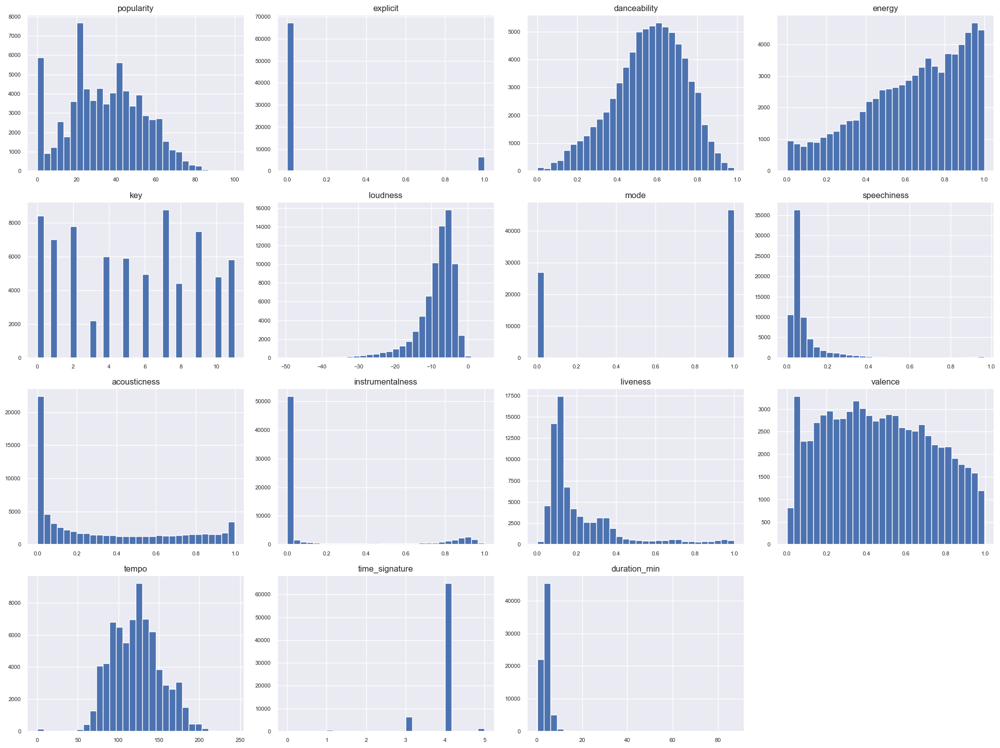

In [203]:
num_cols = data[data.columns[(data.dtypes == 'float64') | (data.dtypes == 'int64')]]
num_cols.shape
sns.set_style('darkgrid')
num_cols.hist(figsize=(20,15), bins=30, xlabelsize=8, ylabelsize=8)
plt.tight_layout()
plt.show()

<h1> EDA of Data </h1>

<h3> Popularity </h3>

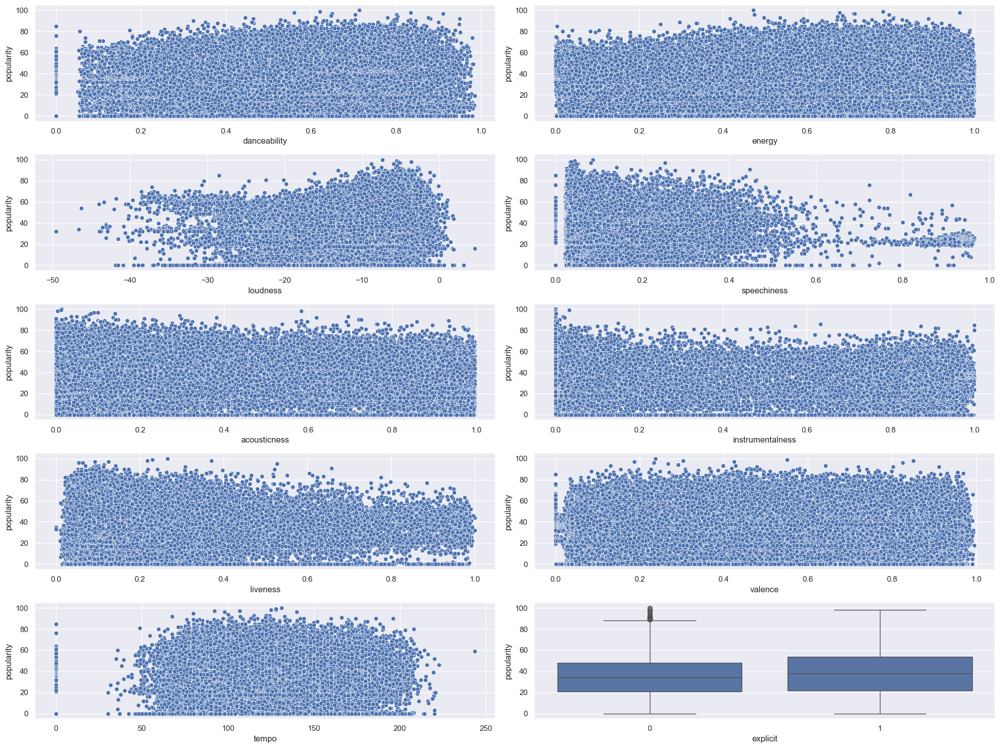

In [204]:
fig, ax = plt.subplots(5, 2, figsize=(20, 15))
sns.scatterplot(x='danceability', y='popularity', data=data, ax=ax[0, 0])
sns.scatterplot(x='energy', y='popularity', data=data, ax=ax[0, 1])
sns.scatterplot(x='loudness', y='popularity', data=data, ax=ax[1, 0])
sns.scatterplot(x='speechiness', y='popularity', data=data, ax=ax[1, 1])
sns.scatterplot(x='acousticness', y='popularity', data=data, ax=ax[2, 0])
sns.scatterplot(x='instrumentalness', y='popularity', data=data, ax=ax[2, 1])
sns.scatterplot(x='liveness', y='popularity', data=data, ax=ax[3, 0])
sns.scatterplot(x='valence', y='popularity', data=data, ax=ax[3, 1])
sns.scatterplot(x='tempo', y='popularity', data=data, ax=ax[4, 0])
sns.boxplot(x='explicit', y='popularity', data=data, ax=ax[4, 1])
plt.tight_layout()
plt.show()

<h3> Danceability </h3>

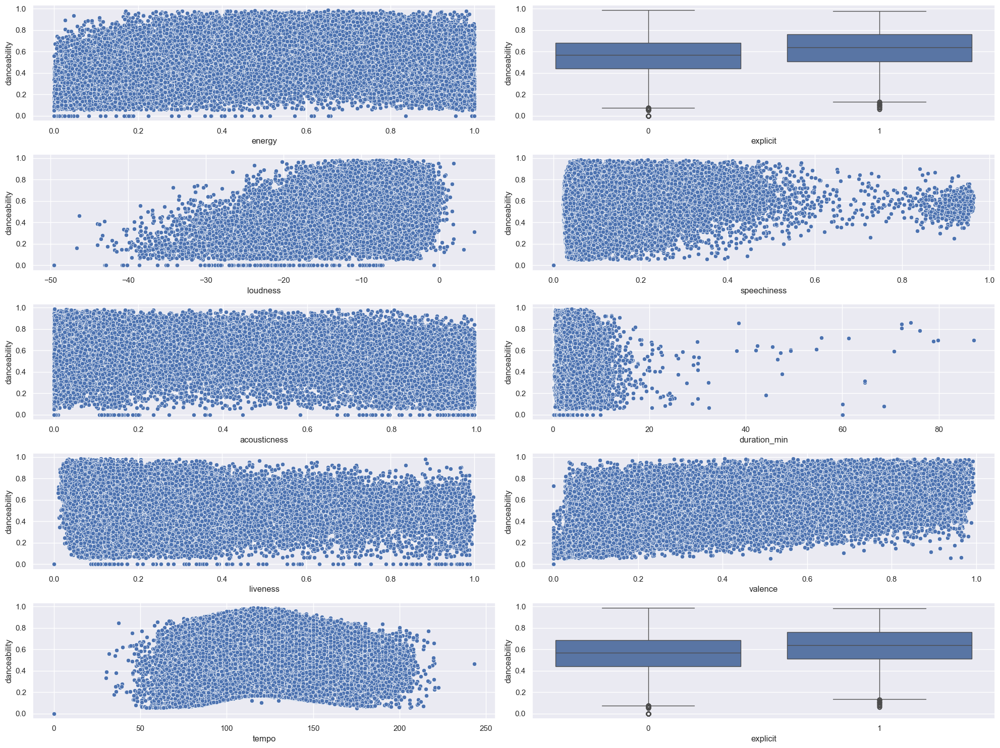

In [205]:
# Series of Plots for danceability
fig, ax = plt.subplots(5, 2, figsize=(20, 15))
sns.scatterplot(x='energy', y='danceability', data=data, ax=ax[0, 0])
sns.boxplot(x='explicit', y='danceability', data=data, ax=ax[0, 1])
sns.scatterplot(x='loudness', y='danceability', data=data, ax=ax[1, 0])
sns.scatterplot(x='speechiness', y='danceability', data=data, ax=ax[1, 1])
sns.scatterplot(x='acousticness', y='danceability', data=data, ax=ax[2, 0])
sns.scatterplot(x='duration_min', y='danceability', data=data, ax=ax[2, 1])
sns.scatterplot(x='liveness', y='danceability', data=data, ax=ax[3, 0])
sns.scatterplot(x='valence', y='danceability', data=data, ax=ax[3, 1])
sns.scatterplot(x='tempo', y='danceability', data=data, ax=ax[4, 0])
sns.boxplot(x='explicit', y='danceability', data=data, ax=ax[4, 1])
plt.tight_layout()

<h3> Energy 

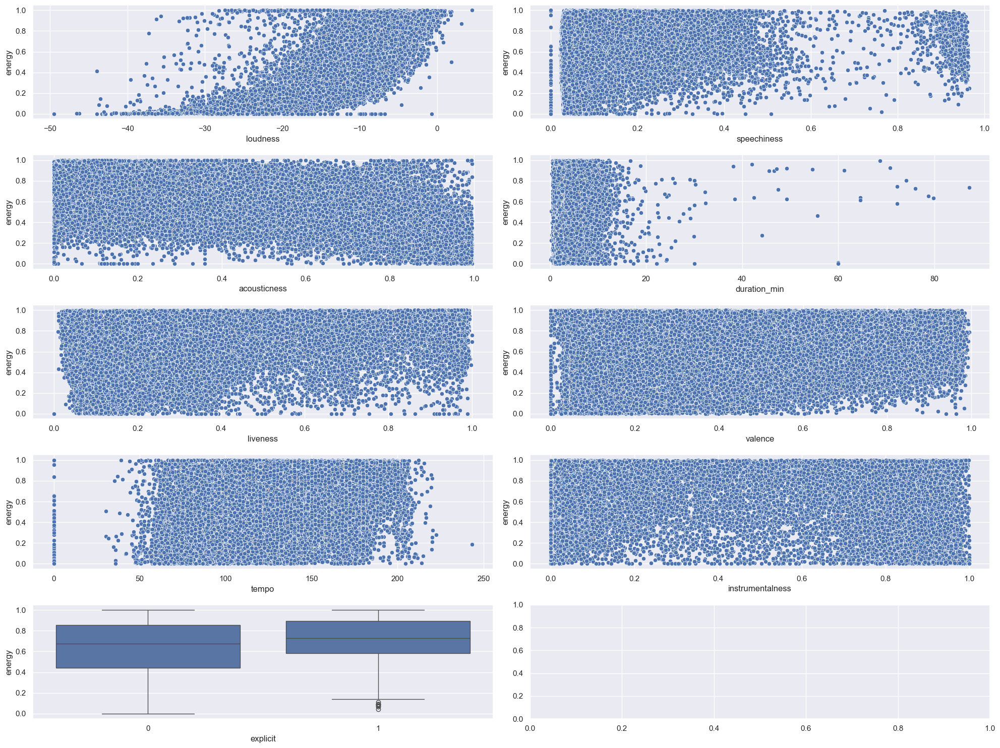

In [206]:
# Series of plots for energy
fig, ax = plt.subplots(5, 2, figsize=(20, 15))
sns.scatterplot(x='loudness', y='energy', data=data, ax=ax[0, 0])
sns.scatterplot(x='speechiness', y='energy', data=data, ax=ax[0, 1])
sns.scatterplot(x='acousticness', y='energy', data=data, ax=ax[1, 0])
sns.scatterplot(x='duration_min', y='energy', data=data, ax=ax[1, 1])
sns.scatterplot(x='liveness', y='energy', data=data, ax=ax[2, 0])
sns.scatterplot(x='valence', y='energy', data=data, ax=ax[2, 1])
sns.scatterplot(x='tempo', y='energy', data=data, ax=ax[3, 0])
sns.scatterplot(x='instrumentalness', y='energy', data=data, ax=ax[3, 1])
sns.boxplot(x='explicit', y='energy', data=data, ax=ax[4, 0])
plt.tight_layout()

<h3> Loudness

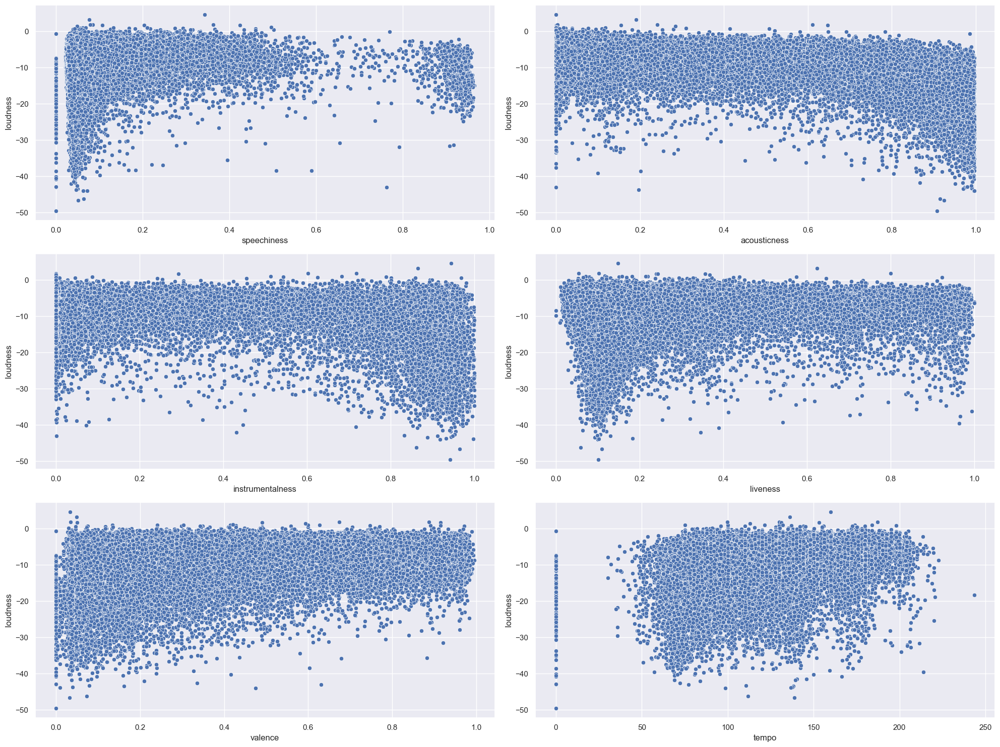

In [207]:
# Series of loudness graphs
fig, ax = plt.subplots(3, 2, figsize=(20, 15))
sns.scatterplot(x='speechiness', y='loudness', data=data, ax=ax[0, 0])
sns.scatterplot(x='acousticness', y='loudness', data=data, ax=ax[0, 1])
sns.scatterplot(x='instrumentalness', y='loudness', data=data, ax=ax[1, 0])
sns.scatterplot(x='liveness', y='loudness', data=data, ax=ax[1, 1])
sns.scatterplot(x='valence', y='loudness', data=data, ax=ax[2, 0])
sns.scatterplot(x='tempo', y='loudness', data=data, ax=ax[2, 1])
plt.tight_layout()

<h3> Speechiness

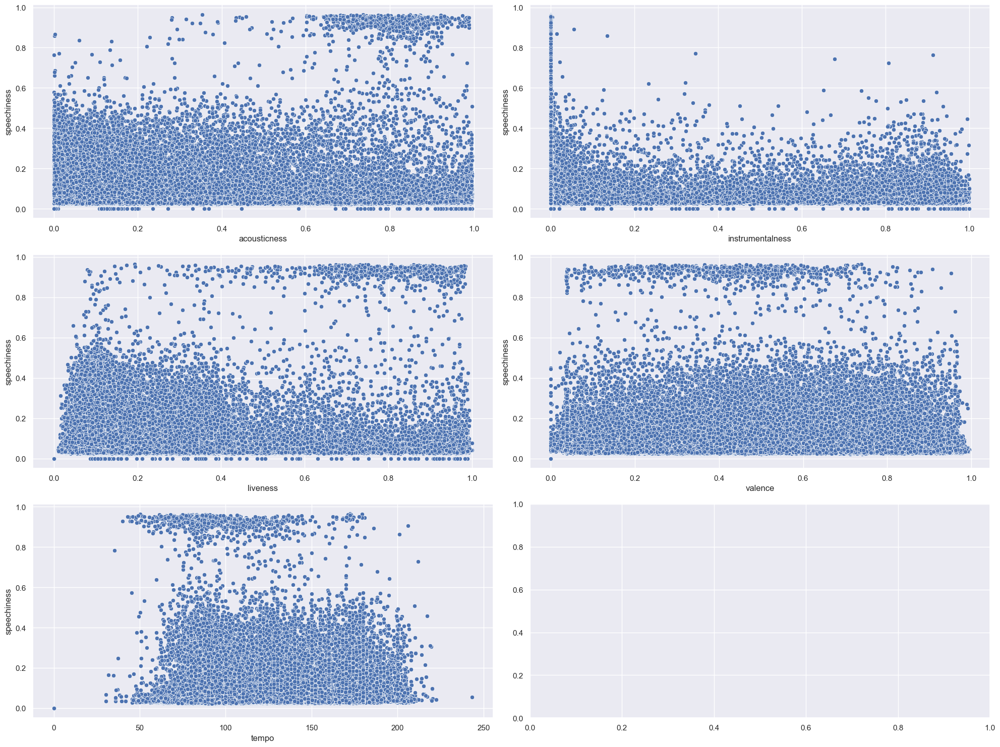

In [208]:
fig, ax = plt.subplots(3, 2, figsize=(20, 15))
sns.scatterplot(x='acousticness', y='speechiness', data=data, ax=ax[0, 0])
sns.scatterplot(x='instrumentalness', y='speechiness', data=data, ax=ax[0, 1])
sns.scatterplot(x='liveness', y='speechiness', data=data, ax=ax[1, 0])
sns.scatterplot(x='valence', y='speechiness', data=data, ax=ax[1, 1])
sns.scatterplot(x='tempo', y='speechiness', data=data, ax=ax[2, 0])
plt.tight_layout()

<h1> Correlation Analysis </h1>

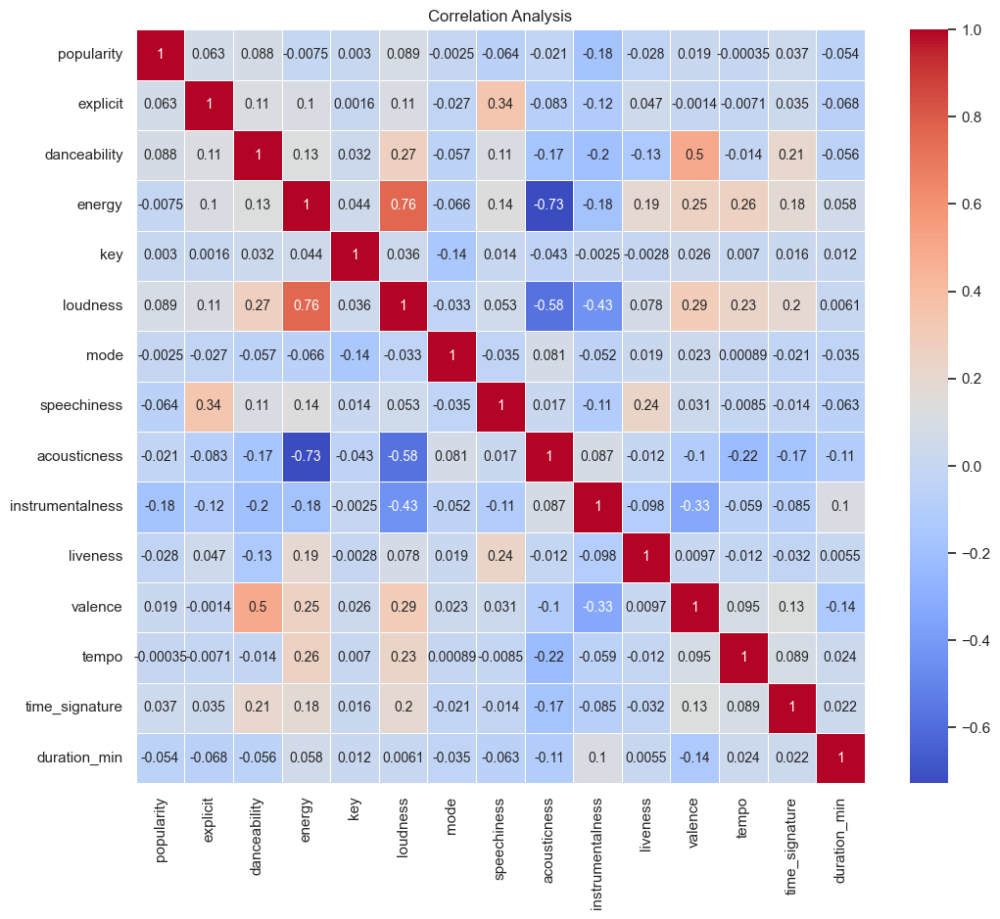

In [209]:
corr_mat = data.select_dtypes(include=["int", "float"]).corr()

# Adjusting figure visuals
plt.figure(figsize=(12, 10), facecolor='white', edgecolor='black')
ax = plt.axes()
ax.set_facecolor('#F2EAC5')
sns.heatmap(corr_mat, annot=True, cmap='coolwarm', linewidths=0.5, annot_kws={"size": 10})
plt.title('Correlation Analysis')
plt.show()

Observations:
There is a strong positive correlation between "loudness" and "energy".

There is a strong negative correlation between "acousticness" and "energy".

There is a strong negative correlation between "acousticness" and "loudness".

There is a negative correlation between "instrumentalness" and "loudness".

There is a weak positive correlation between "valence" (positiveness) and "danceability".

There is a weak positive correlation between "speechiness" and "explicit".

<h1> Cluster Analysis Genre

In [210]:
num_cols = data[data.columns[(data.dtypes == 'float64') | (data.dtypes == 'int64')]]
num_cols.shape

(73608, 15)

In [211]:
num_cols.info()

<class 'pandas.core.frame.DataFrame'>
Index: 73608 entries, 0 to 113999
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   popularity        73608 non-null  int64  
 1   explicit          73608 non-null  int64  
 2   danceability      73608 non-null  float64
 3   energy            73608 non-null  float64
 4   key               73608 non-null  int64  
 5   loudness          73608 non-null  float64
 6   mode              73608 non-null  int64  
 7   speechiness       73608 non-null  float64
 8   acousticness      73608 non-null  float64
 9   instrumentalness  73608 non-null  float64
 10  liveness          73608 non-null  float64
 11  valence           73608 non-null  float64
 12  tempo             73608 non-null  float64
 13  time_signature    73608 non-null  int64  
 14  duration_min      73608 non-null  float64
dtypes: float64(10), int64(5)
memory usage: 9.0 MB


In [212]:
features = data[['danceability', 'energy', 'valence', 'acousticness', 'instrumentalness']] # features selected by refering correlation matrix 
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)
data['track_genre'].unique()

array(['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago-house', 'children',
       'chill', 'classical', 'club', 'comedy', 'country', 'dance',
       'dancehall', 'death-metal', 'deep-house', 'detroit-techno',
       'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
       'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
       'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove',
       'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle',
       'heavy-metal', 'hip-hop', 'honky-tonk', 'house', 'idm', 'indian',
       'indie-pop', 'indie', 'industrial', 'iranian', 'j-dance', 'j-idol',
       'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids', 'latin', 'latino',
       'malay', 'mandopop', 'metal', 'metalcore', 'minimal-techno', 'mpb',
       'new-age', 'opera', 'pagode', 'party', 'piano', 'pop-film', 'pop',
       'pow

In [213]:
genre_to_category = {

    'edm': 'Electronic Modern Music', 
    'house': 'Electronic Modern Music', 
    'electro': 'Electronic Modern Music', 
    'trance': 'Electronic Modern Music', 
    'techno': 'Electronic Modern Music', 
    'dubstep': 'Electronic Modern Music', 
    'drum-and-bass': 'Electronic Modern Music', 
    'deep-house': 'Electronic Modern Music', 
    'detroit-techno': 'Electronic Modern Music', 
    'minimal-techno': 'Electronic Modern Music', 
    'progressive-house': 'Electronic Modern Music', 
    'breakbeat': 'Electronic Modern Music',
    
    'alt-rock': 'Rock', 
    'rock': 'Rock', 
    'indie': 'Rock', 
    'indie-pop': 'Rock', 
    'punk': 'Rock', 
    'punk-rock': 'Rock', 
    'hard-rock': 'Rock', 
    'metal': 'Rock', 
    'heavy-metal': 'Rock', 
    'black-metal': 'Rock', 
    'death-metal': 'Rock', 
    'grunge': 'Rock',
    
    'hip-hop': 'Hip-Hop and R&B', 
    'r-n-b': 'Hip-Hop and R&B', 
    'trap': 'Hip-Hop and R&B',
    
    'pop': 'Pop & Modern Music', 
    'electro-pop': 'Pop & Modern Music', 
    'synth-pop': 'Pop & Modern Music', 
    'k-pop': 'Pop & Modern Music', 
    'pop-film': 'Pop & Modern Music', 
    'power-pop': 'Pop & Modern Music',
    
    'latin': 'Latin & Reggae/Dancehall', 
    'reggaeton': 'Latin & Reggae/Dancehall', 
    'salsa': 'Latin & Reggae/Dancehall', 
    'samba': 'Latin & Reggae/Dancehall', 
    'reggae': 'Latin & Reggae/Dancehall', 
    'dancehall': 'Latin & Reggae/Dancehall',
    
    'funk': 'Funk & Disco', 
    'disco': 'Funk & Disco', 
    'groove': 'Funk & Disco',
}

# Map each track to a category
data['music_category'] = data['track_genre'].apply(lambda x: genre_to_category.get(x, 'Other'))
data['music_category'].unique() 

array(['Other', 'Rock', 'Electronic Modern Music',
       'Latin & Reggae/Dancehall', 'Funk & Disco', 'Hip-Hop and R&B',
       'Pop & Modern Music'], dtype=object)

In [214]:
data.sample(5)

,artists,track_name,popularity,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,duration_min,music_category
24386,Omar S;Colonel Abrams,Who Wrote the Rules of Love - R&B Long Mix,8,0,0.831,0.645,0,-8.860,1,0.0383,0.00325,0.023800,0.0566,0.533,120.007,4,detroit-techno,6.925533,Electronic Modern Music
107596,Papa Dance,Pocztówka z wakacji,25,0,0.616,0.729,0,-8.038,1,0.0295,0.04100,0.000041,0.3660,0.439,146.167,4,synth-pop,3.539333,Pop & Modern Music
55242,The Local Train,Aaftaab,58,0,0.464,0.391,6,-9.884,1,0.0384,0.75500,0.000096,0.1050,0.418,106.887,4,indian,3.891183,Other
83160,Martin Garrix;Usher,Don't Look Down (feat. Usher),64,0,0.575,0.831,0,-5.972,1,0.0356,0.00406,0.000449,0.1110,0.377,127.991,4,progressive-house,3.718983,Electronic Modern Music
96928,Seu Jorge,Sossego Músic Incidental Deixa Isso Prá Lá (Ao...,35,0,0.575,0.921,5,-4.778,1,0.3330,0.42000,0.001050,0.9790,0.406,137.017,4,samba,5.495550,Latin & Reggae/Dancehall


In [215]:
kmeans = KMeans(n_clusters=7, random_state=48) 
data['cluster_genre'] = kmeans.fit_predict(scaled_features)
#PCA for visualisation
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(scaled_features)

c:\Users\kylem\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


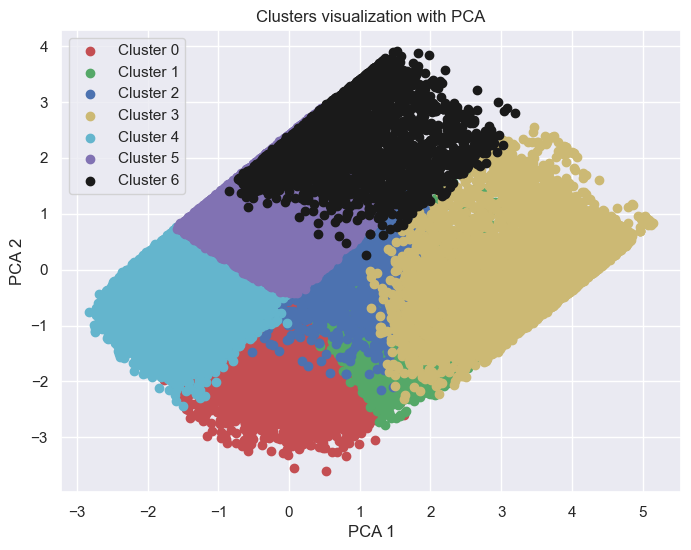

In [216]:
plt.figure(figsize=(8, 6))
colors = ['r', 'g', 'b', 'y', 'c', 'm', 'k']  # Colors for the clusters

# Plot each cluster
for i in range(7):
    
    idx = data['cluster_genre'] == i
    plt.scatter(reduced_features[idx, 0], reduced_features[idx, 1], c=colors[i], label=f'Cluster {i}')

# Adjust visuals
plt.title('Clusters visualization with PCA')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.legend()
plt.grid(True)
plt.show()


In [217]:
data.head()

,artists,track_name,popularity,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,duration_min,music_category,cluster_genre
0,Gen Hoshino,Comedy,73,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic,3.844433,Other,4
1,Ben Woodward,Ghost - Acoustic,55,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic,2.493500,Other,1
2,Ingrid Michaelson;ZAYN,To Begin Again,57,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic,3.513767,Other,1
3,Kina Grannis,Can't Help Falling In Love,71,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic,3.365550,Other,1
4,Chord Overstreet,Hold On,82,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic,3.314217,Other,1


c:\Users\kylem\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\kylem\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\kylem\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\kylem\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\cluster\

c:\Users\kylem\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\kylem\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\kylem\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\kylem\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\cluster\

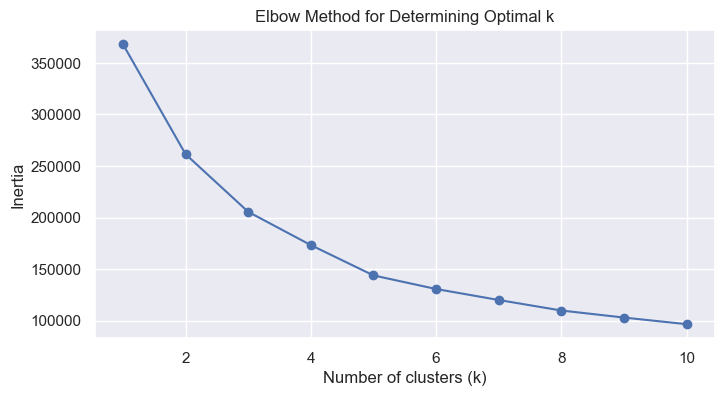

In [218]:
inertia = []
k_values = range(1, 11)
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_features)
    inertia.append(kmeans.inertia_)

# Plotting the elbow graph
plt.figure(figsize=(8, 4))
plt.plot(k_values, inertia, marker='o')
plt.title('Elbow Method for Determining Optimal k')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()

In [219]:
# Applying K-means with k=3
kmeans = KMeans(n_clusters=3, random_state=42)
data['cluster'] = kmeans.fit_predict(scaled_features)

c:\Users\kylem\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<h3> Cluster Analysis of Popularity

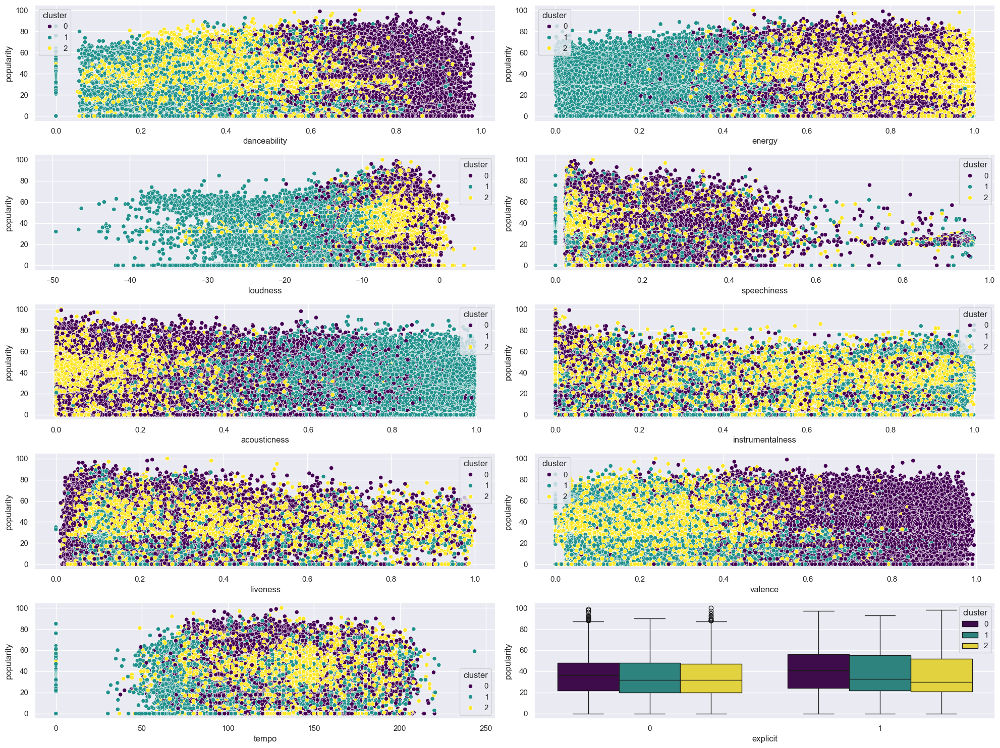

In [220]:
fig, ax = plt.subplots(5, 2, figsize=(20, 15))
sns.scatterplot(x='danceability', y='popularity', data=data, hue='cluster', palette='viridis', ax=ax[0, 0])
sns.scatterplot(x='energy', y='popularity', data=data, hue='cluster', palette='viridis', ax=ax[0, 1])
sns.scatterplot(x='loudness', y='popularity', data=data, hue='cluster', palette='viridis', ax=ax[1, 0])
sns.scatterplot(x='speechiness', y='popularity', data=data, hue='cluster', palette='viridis', ax=ax[1, 1])
sns.scatterplot(x='acousticness', y='popularity', data=data, hue='cluster', palette='viridis', ax=ax[2, 0])
sns.scatterplot(x='instrumentalness', y='popularity', data=data, hue='cluster', palette='viridis', ax=ax[2, 1])
sns.scatterplot(x='liveness', y='popularity', data=data, hue='cluster', palette='viridis', ax=ax[3, 0])
sns.scatterplot(x='valence', y='popularity', data=data, hue='cluster', palette='viridis', ax=ax[3, 1])
sns.scatterplot(x='tempo', y='popularity', data=data, hue='cluster', palette='viridis', ax=ax[4, 0])
sns.boxplot(x='explicit', y='popularity', data=data, hue='cluster', palette='viridis', ax=ax[4, 1])
plt.tight_layout()
plt.show()

<h3> Cluster Analysis of Danceability

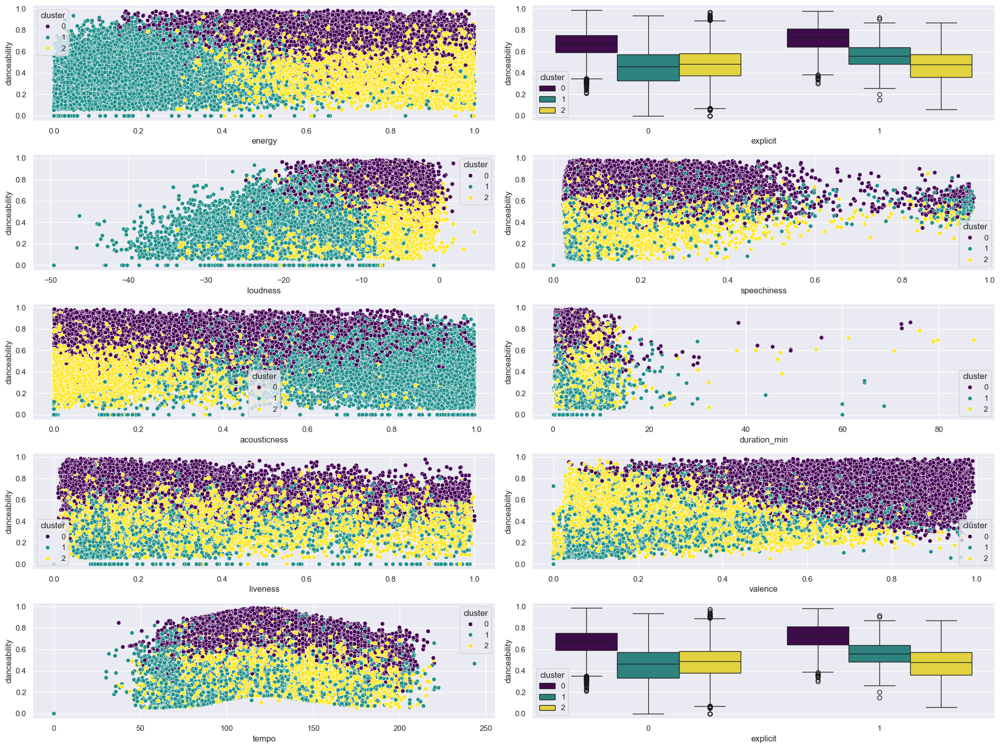

In [221]:
# Series of Plots for danceability
fig, ax = plt.subplots(5, 2, figsize=(20, 15))
sns.scatterplot(x='energy', y='danceability', data=data, hue='cluster', palette='viridis', ax=ax[0, 0])
sns.boxplot(x='explicit', y='danceability', data=data,hue='cluster', palette='viridis', ax=ax[0, 1])
sns.scatterplot(x='loudness', y='danceability', data=data,hue='cluster', palette='viridis', ax=ax[1, 0])
sns.scatterplot(x='speechiness', y='danceability', data=data,hue='cluster', palette='viridis', ax=ax[1, 1])
sns.scatterplot(x='acousticness', y='danceability', data=data,hue='cluster', palette='viridis', ax=ax[2, 0])
sns.scatterplot(x='duration_min', y='danceability', data=data,hue='cluster', palette='viridis' ,ax=ax[2, 1])
sns.scatterplot(x='liveness', y='danceability', data=data,hue='cluster', palette='viridis', ax=ax[3, 0])
sns.scatterplot(x='valence', y='danceability', data=data,hue='cluster', palette='viridis', ax=ax[3, 1])
sns.scatterplot(x='tempo', y='danceability', data=data,hue='cluster', palette='viridis', ax=ax[4, 0])
sns.boxplot(x='explicit', y='danceability', data=data,hue='cluster', palette='viridis', ax=ax[4, 1])
plt.tight_layout()

<h3> Cluster Analysis of Energy

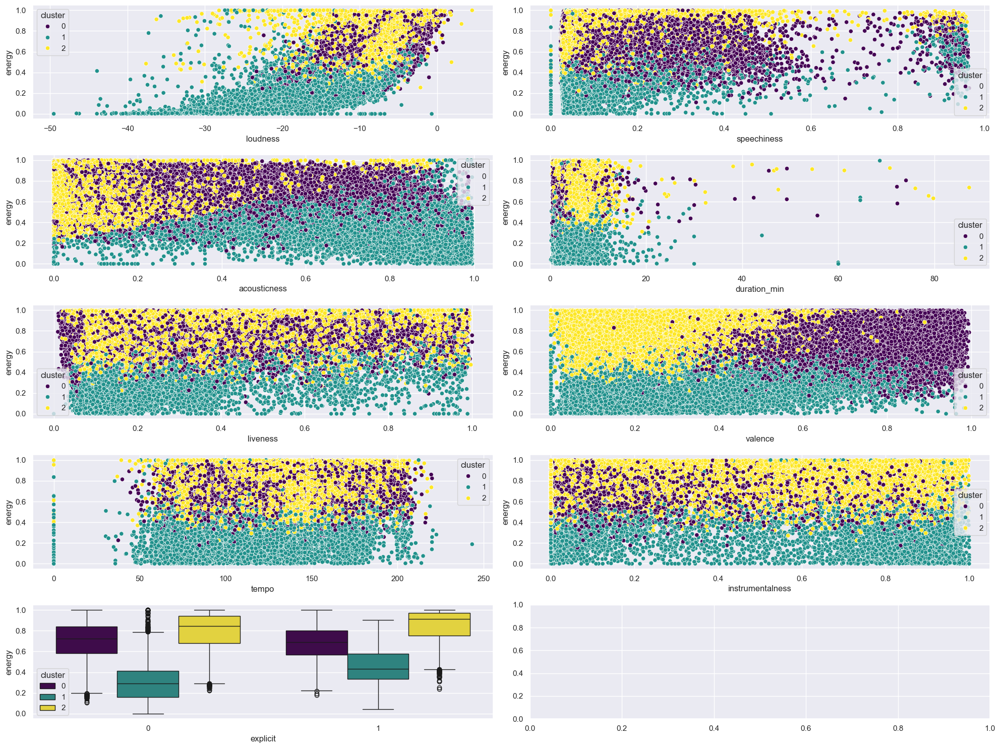

In [222]:
# Series of plots for energy
fig, ax = plt.subplots(5, 2, figsize=(20, 15))
sns.scatterplot(x='loudness', y='energy', data=data,hue='cluster', palette='viridis', ax=ax[0, 0])
sns.scatterplot(x='speechiness', y='energy', data=data,hue='cluster', palette='viridis', ax=ax[0, 1])
sns.scatterplot(x='acousticness', y='energy', data=data,hue='cluster', palette='viridis', ax=ax[1, 0])
sns.scatterplot(x='duration_min', y='energy', data=data,hue='cluster', palette='viridis', ax=ax[1, 1])
sns.scatterplot(x='liveness', y='energy', data=data,hue='cluster', palette='viridis', ax=ax[2, 0])
sns.scatterplot(x='valence', y='energy', data=data,hue='cluster', palette='viridis', ax=ax[2, 1])
sns.scatterplot(x='tempo', y='energy', data=data,hue='cluster', palette='viridis', ax=ax[3, 0])
sns.scatterplot(x='instrumentalness', y='energy',hue='cluster', palette='viridis', data=data, ax=ax[3, 1])
sns.boxplot(x='explicit', y='energy', data=data,hue='cluster', palette='viridis', ax=ax[4, 0])
plt.tight_layout()